# ProXide: Proximity based drug side effect detection

Analysis accompanying the manuscript for "Investigating side effect modules in the interactome and
their use in drug adverse effect discovery"

## Requiremets

- R packages required
    - ggplot2
    - ROCR
    - reshape


- Data files
    - module.dat
    - degree.dat
    - validation.dat
    - metrics_sider.dat
    - metrics_offsides.dat
    
## Side effect modules in the interactome

Each point represents a side effect consisting of proteins identified
to be significantly associated to the side effect. The x-axis is the number
of proteins in the side effect module and the y-axis is the number of drugs
that shows the side effect. The size of the points scales with the median
degree of the proteins in the side effect module.

Loading required package: ggplot2
Loading required package: reshape
Loading required package: ROCR
Loading required package: gplots

Attaching package: ‘gplots’

The following object is masked from ‘package:stats’:

    lowess

Warning message:
In cor.test.default(d$n.target, d$n.drug, method = "spearman"): Cannot compute exact p-value with ties


	Spearman's rank correlation rho

data:  d$n.target and d$n.drug
S = 21650000, p-value = 0.0001769
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.1611388 



Warning message:
In cor.test.default(d$k.target.mean, d$n.drug, method = "spearman"): Cannot compute exact p-value with ties


	Spearman's rank correlation rho

data:  d$k.target.mean and d$n.drug
S = 25139000, p-value = 0.5485
alternative hypothesis: true rho is not equal to 0
sample estimates:
       rho 
0.02594864 



   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.00    9.80   12.92   20.79   24.31  123.60 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1.00    3.00    7.00   21.18   20.00  872.00 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1.00    4.00   11.00   26.46   24.00  379.00 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1.00    2.00    7.00   21.07   20.00  872.00 

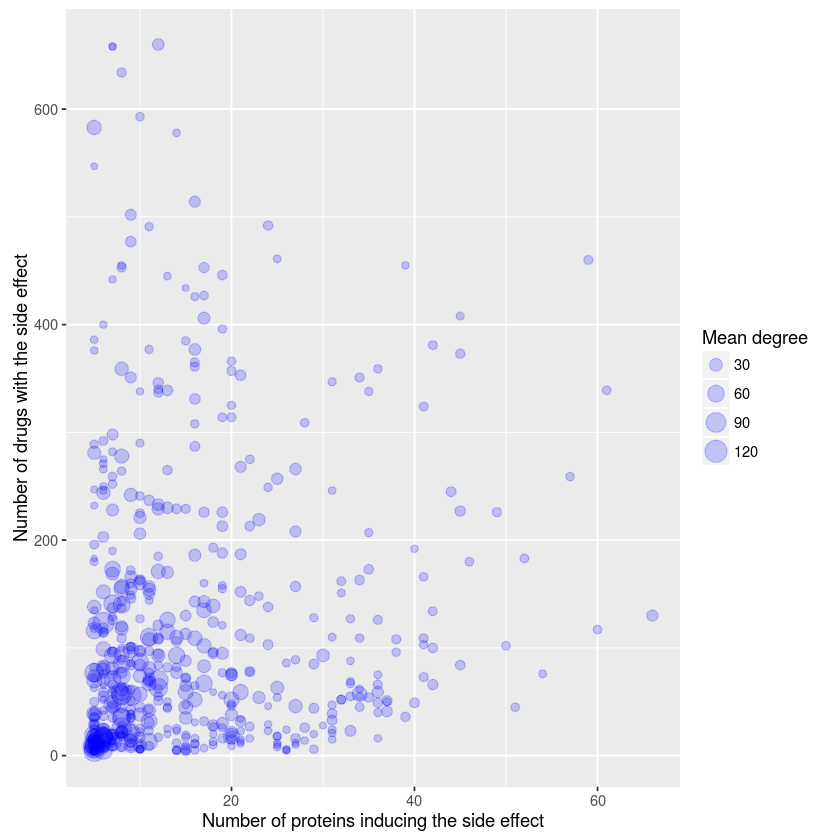

In [1]:
# Load required packages
require(ggplot2)
require(reshape)
require(ROCR)
color.palette <- c("blue", "orange", "grey20", "red", "green", "yellow")

# Module scatter plot
base.dir = "./"
file.name = paste0(base.dir, "module.dat")
d = read.csv(file.name, sep="\t")
p = ggplot(data=d, aes(n.target, n.drug)) + geom_point(aes(size=k.target.mean), alpha=0.2, color="blue")
p = p + labs(x = "Number of proteins inducing the side effect", y = "Number of drugs with the side effect")
p = p + guides(size=guide_legend(title="Mean degree"))
print(p)

# Correlation between side effect proteins and number of drugs with the side effect
a = cor.test(d$n.target, d$n.drug, method="spearman")
print(a)

# Correlation between average degree of side effect proteins and number of drugs with the side effect
a = cor.test(d$k.target.mean, d$n.drug, method="spearman")                              
print(a)

# Degrees of side effect proteins in modules
summary(d$k.target.mean)

file.name = paste0(base.dir, "degree.dat")
d=read.csv(file.name, sep="\t")

# Average degree of network
summary(d$degree)

# Average degree of side effect proteins
x=d[d$flag==1,"degree"]
summary(x)

# Average degree of non-side effect proteins
y=d[d$flag==0,"degree"]
summary(y)

## Network based closeness of drugs and side effects

The closeness between drug targets and side effects
calculated using five topological measures
(Closest, Shortest, PageRank, NetScore and Proximity)
for each of 817 drugs and 537 side effects. Known drug - side effect
associations are taken from SIDER.

Using known as id variables


[1] "AUC Shortest: 59.791"
[1] "One sided Mann Whitney U: 0.0e+00"
[1] "AUC Closest: 67.912"
[1] "One sided Mann Whitney U: 0.0e+00"
[1] "AUC PageRank: 69.015"
[1] "One sided Mann Whitney U: 0.0e+00"
[1] "AUC NetScore: 71.719"
[1] "One sided Mann Whitney U: 0.0e+00"
[1] "AUC Proximity: 71.097"
[1] "One sided Mann Whitney U: 0.0e+00"


Using known as id variables


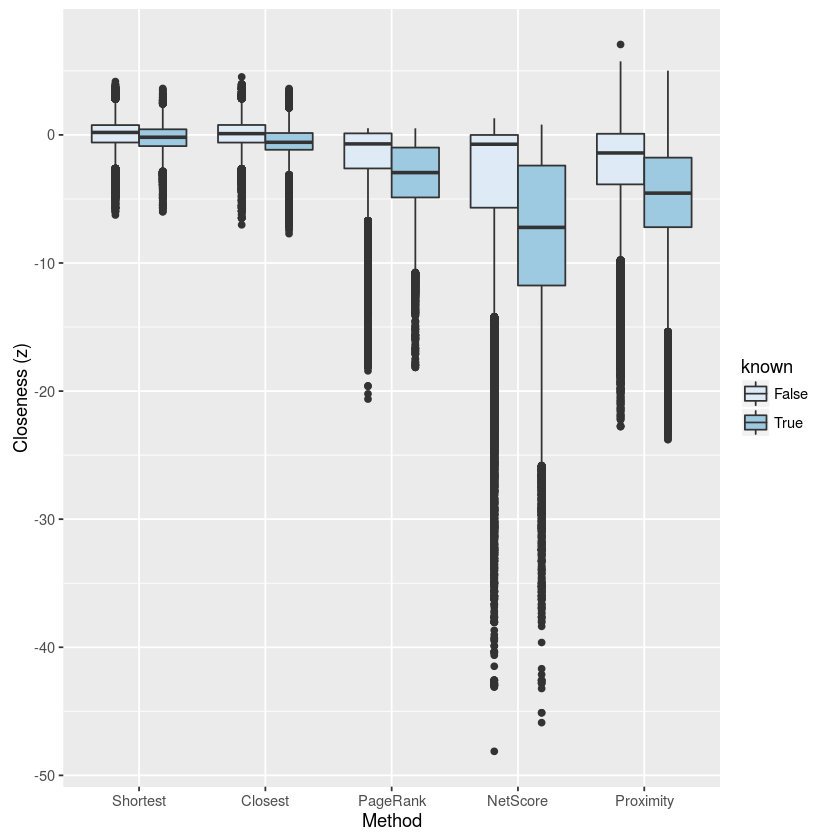

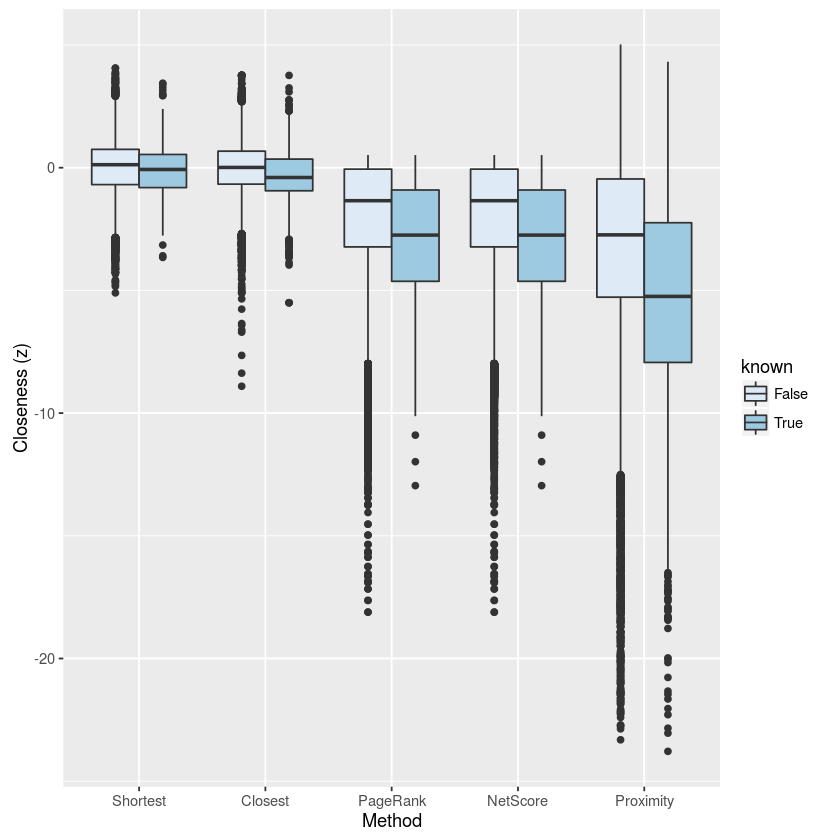

In [2]:
file.name = paste0(base.dir, "metrics_sider.dat")
d = read.csv(file.name, sep="\t")
methods = c("Shortest", "Closest", "PageRank", "NetScore", "Proximity")
e = melt(d[,-c(1,2)]) # remove drug & side effect info
e$variable = factor(e$variable, levels=methods)
p = ggplot(e, aes(variable, value)) + geom_boxplot(aes(fill=known)) + scale_fill_brewer()
p = p + labs(x="Method", y="Closeness (z)")
print(p)
for(method in methods) {
    pred = prediction(d[[method]], d$known)
    perf = performance(pred, "auc") 
    a = 100 * (1 - perf@y.values[[1]]) # lower score better
    print(sprintf("AUC %s: %.3f", method, a))
    x = d[d$known == "True", method]
    y = d[d$known != "True", method]
    a = wilcox.test(x, y, alternative="less")
    print(sprintf("One sided Mann Whitney U: %.1e", a$p.value))
}

# OFFSIDES
file.name = paste0(base.dir, "metrics_offsides.dat")
d = read.csv(file.name, sep="\t")
methods = c("Shortest", "Closest", "PageRank", "NetScore", "Proximity")
e = melt(d[,-c(1,2)]) # remove drug & side effect info
e$variable = factor(e$variable, levels=methods)
p = ggplot(e, aes(variable, value)) + geom_boxplot(aes(fill=known)) + scale_fill_brewer()
p = p + labs(x="Method", y="Closeness (z)")
print(p)

## Assessing the effect of the data incompleteness

AUROC and AUPRC values when the analysis is repeated on a subset of drugs and side effects categorized based on the
number of targets drugs have (m) and number of proteins associated to the side effect (n).


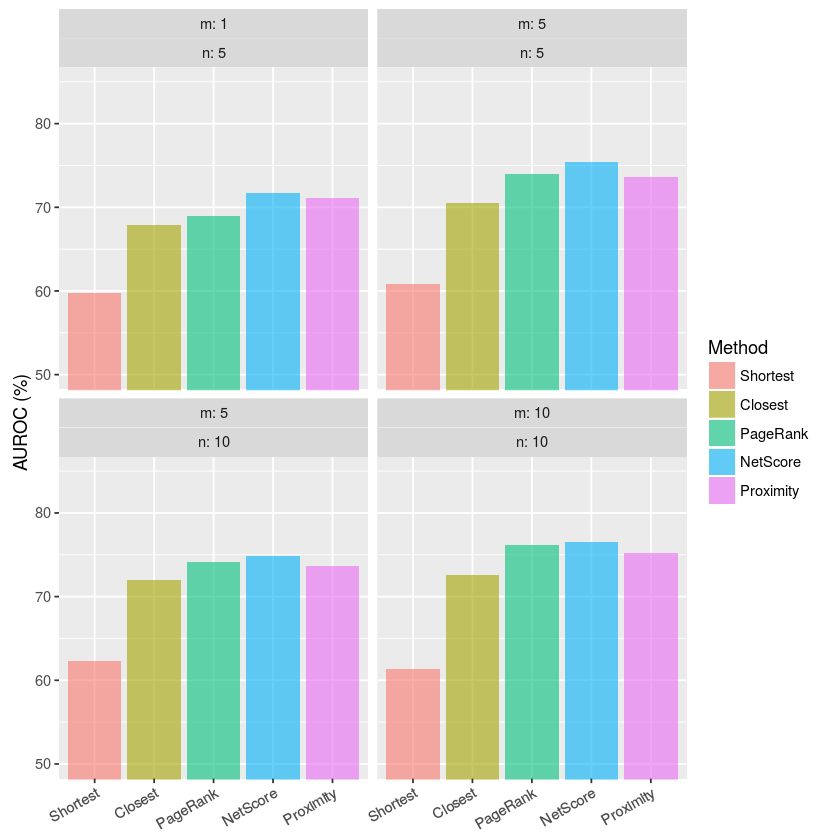

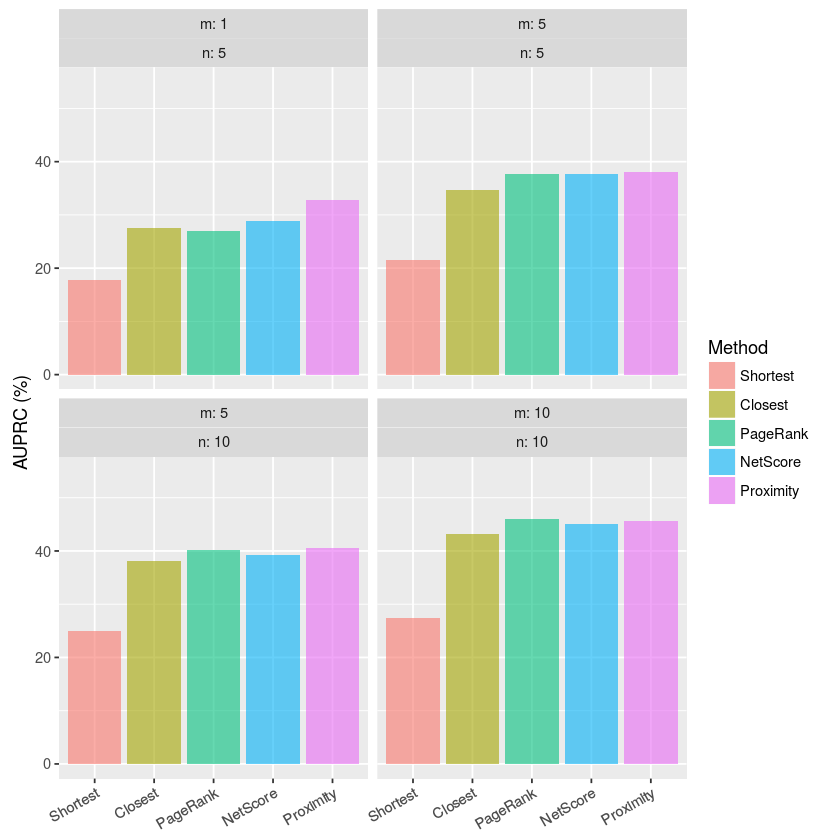

In [3]:
file.name = paste0(base.dir, "validation.dat")
d = read.csv(file.name, sep="\t")
d = cbind(d[,-(8:10)], apply(d[,8:10], 2, function(x){round(100*x, 1)}))
d$method = factor(d$method, levels=c("Shortest", "Closest", "PageRank", "NetScore", "Proximity"))
d$source = factor(d$source, levels=c("sider", "offsides"))

d$cutoff.drug.target = paste0("m: ", d$cutoff.drug.target)
d$cutoff.drug.target = factor(d$cutoff.drug.target, levels=c("m: 1", "m: 5", "m: 10"))
d$cutoff.se.target = paste0("n: ", d$cutoff.se.target)
d$cutoff.se.target = factor(d$cutoff.se.target, levels=c("n: 5", "n: 10"))
e = d[d$source=="sider",]

#AUROC
p = ggplot(data=e, aes(method, auc)) + geom_bar(aes(fill=method), stat="identity", position="dodge", alpha=0.6)
p = p + coord_cartesian(ylim = c(50, 85)) + guides(fill=guide_legend("Method"))
p = p + labs(x = NULL, y = "AUROC (%)") + facet_wrap(~cutoff.drug.target + cutoff.se.target)
p = p + theme(axis.text.x = element_text(angle = 30, hjust = 1))
print(p)

# AUPRC
p = ggplot(data=e, aes(method, auprc)) + geom_bar(aes(fill=method), stat="identity", position="dodge", alpha=0.6)
p = p + coord_cartesian(ylim = c(0, 55)) + guides(fill=guide_legend("Method"))
p = p + labs(x = NULL, y = "AUPRC (%)") + facet_wrap(~cutoff.drug.target + cutoff.se.target)
p = p + theme(axis.text.x = element_text(angle = 30, hjust = 1))
print(p)
